<a href="https://colab.research.google.com/github/1724prachiti/ousums/blob/main/JSK3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Sat Jun 15 13:38:51 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


In [3]:
!pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'

  Preparing metadata (setup.py) ... done


In [4]:
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.0/124.0 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 80.1 MB/s eta 0:00:00
Reason for being yanked: deprecated, use 4.8.0.76


In [5]:

!mkdir -p {HOME}/weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P {HOME}/weights

In [6]:
import os

CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))

/content/weights/sam_vit_h_4b8939.pth ; exist: True


In [7]:
!mkdir -p {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg -P {HOME}/data

In [9]:
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

In [11]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

In [12]:
mask_predictor = SamPredictor(sam)

In [13]:
import os

IMAGE_NAME = "/content/6.jpg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)
print(type(IMAGE_PATH))

<class 'str'>


In [14]:
import os

IMAGE_NAME = "/content/6.jpg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

In [15]:
# helper function that loads an image before adding it to the widget

import base64

def encode_image(filepath):
    with open(filepath, 'rb') as f:
        image_bytes = f.read()
    encoded = str(base64.b64encode(image_bytes), 'utf-8')
    return "data:image/jpg;base64,"+encoded

In [19]:
mask_generator = SamAutomaticMaskGenerator(sam, points_per_batch=16)

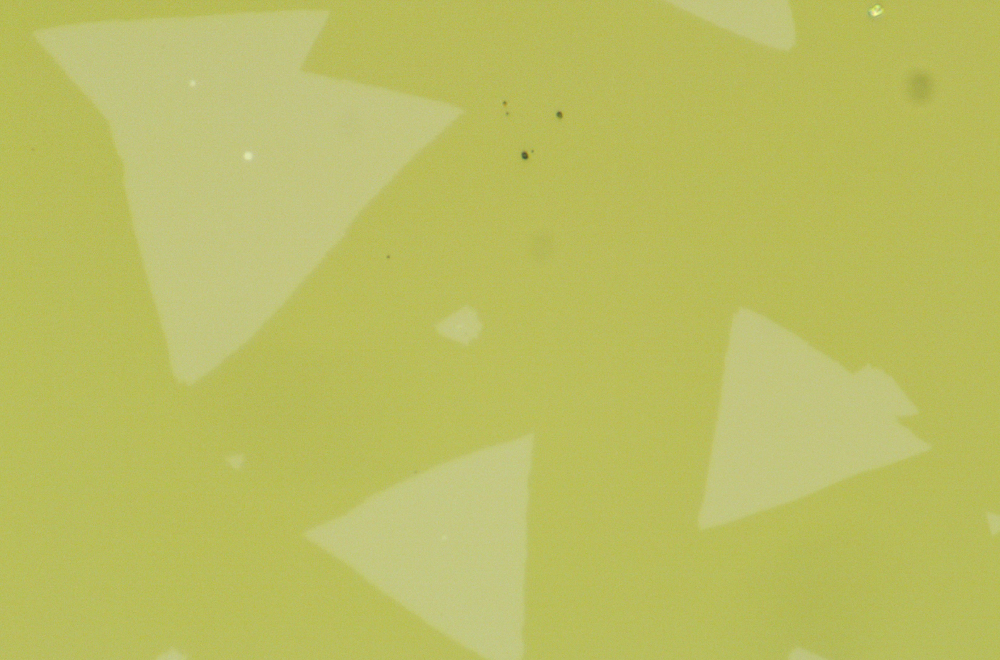

In [20]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/6.jpg')

# Display the image
cv2_imshow(image)

In [21]:
#new
import cv2
import supervision as sv


image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

sam_result = mask_generator.generate(image_rgb)

In [29]:
maskk = []
values_list=[]
values_list1=[]
for i in range(len(sam_result)):
  maskk.append(sam_result[i]['bbox'])
  values_list.append(maskk[i][2])
  values_list1.append(maskk[i][3])



import numpy as np
#0

values_list = list(set(values_list))
values_list1 = list(set(values_list1))
values_list = np.sort(values_list)
values_list1 = np.sort(values_list1)


# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = np.percentile(values_list, 25)
Q3 = np.percentile(values_list, 75)

# Calculate the IQR
IQR = Q3 - Q1

# Define the bounds for outliers

# Initialize two lists to hold the separated values
large_values = []
other_values = []

# Iterate through each value in the list
for value in values_list:
    if value < Q1 or value > Q3:
        large_values.append(value)
    else:
        other_values.append(value)

# Print the results


print('no. of triangles are triangles:'+str(len(other_values)))
#1



# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = np.percentile(values_list1, 25)
Q3 = np.percentile(values_list1, 75)

# Calculate the IQR
IQR = Q3 - Q1

# Define the bounds for outliers

# Initialize two lists to hold the separated values
large_values1 = []
other_values1 = []

# Iterate through each value in the list
for value in values_list1:
    if value < Q1 or value > Q3:
        large_values1.append(value)
    else:
        other_values1.append(value)

# Print the results


print('no. of triangles are triangles:'+str(len(other_values1)))
print(other_values)
print(other_values1)


no. of triangles are triangles:7
no. of triangles are triangles:7
[105, 127, 150, 416, 747, 762, 1400]
[96, 104, 130, 167, 725, 738, 1154]


In [36]:
index=[]
index1=[]
findex=[]
for i in range(len(values_list)):
  if values_list[i] in other_values:
    index.append(i)
for i in range(len(values_list1)):
  if values_list1[i] in other_values1:
    index1.append(i)
print(index)
print(index1)

for i in index:
  if i in index1:
    findex.append(i)
print(findex)


[3, 4, 5, 6, 7, 8, 9]
[3, 4, 5, 6, 7, 8, 9]
[3, 4, 5, 6, 7, 8, 9]


In [39]:
print(len(maskk))

15


In [40]:
index = [i for i in index if i < len(maskk)]

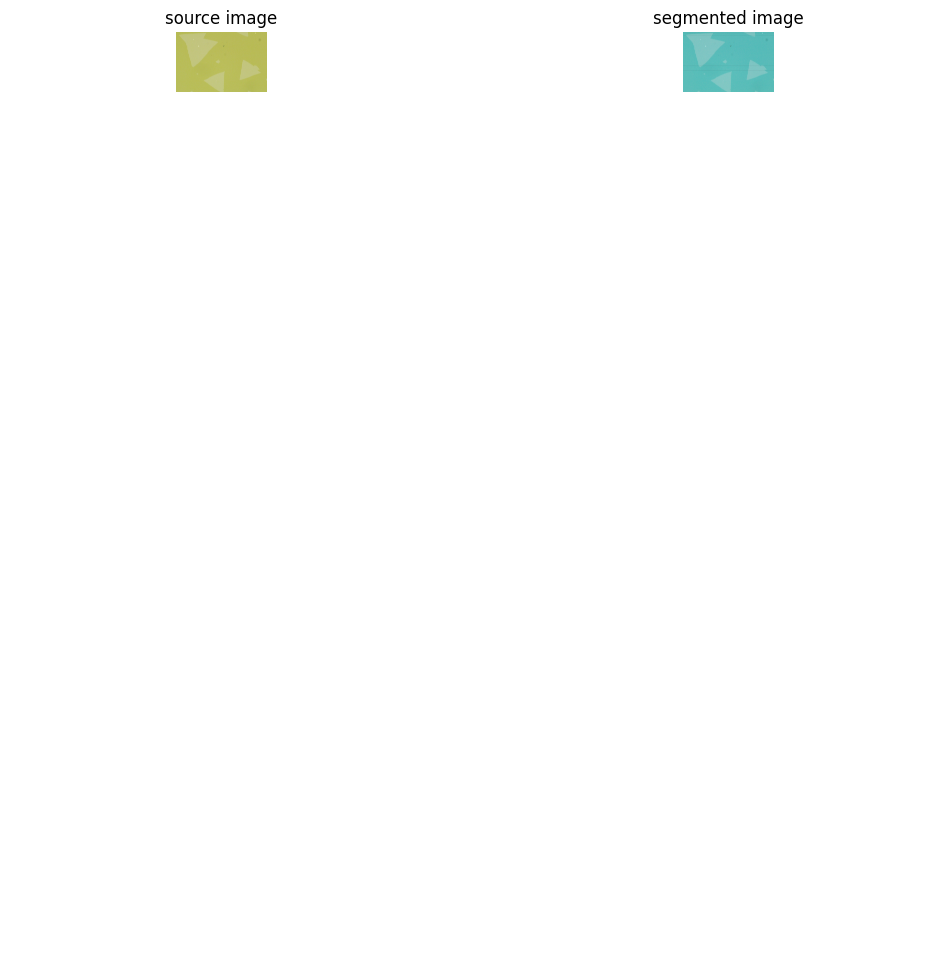

IndexError: index 2208 is out of bounds for axis 0 with size 2181

In [42]:
for i in index:
    temp = image_rgb.copy()
    temp[maskk[i]] = 0.0

    sv.plot_images_grid(
        images=[image_bgr, temp],
        grid_size=(len(sam_result), 2),
        titles=['source image', 'segmented image']
    )